In [1]:
import numpy as np
import pymc as pm
import arviz as az
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import sys

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
sys.path.append('../')
plt.style.use('plotting_style.mpltstyle')
sns.set_style('whitegrid')

In [3]:
az.rcParams["plot.max_subplots"] = 210

In [4]:
def load_posteriors(path, filename):
    filename = f'{path}/{filename}'
    with open(filename, 'rb') as f:
        posterior = pd.read_pickle(f)

    return posterior

In [5]:
# load posteriors -> SELECT RIGHT PATH DEPENDING ON OS!
#path = '/Volumes/T7/Pacman_Pickle' #/09_01_2025/' # iOS
path = 'E:Pacman_Pickle' #/09_01_2025/' # Windows

In [6]:
posteriorsEVPRM = load_posteriors(path, 'posterior_EVPRM_empirical.pkl')

In [7]:
posteriorsEVPRM

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data

## Plot Priors and Posterior Distributions of EVPRM
<u>Priors:</u>
- $\beta\sim\Gamma(3,1)$
- $R_0\sim\Gamma(55,.75)$
- $h\sim Beta(3,3)$

In [8]:
with pm.Model() as EVPRM:        
        # priors for free parameters     
        beta = pm.Gamma('beta', alpha=3, beta=1, shape=70)
        R0 = pm.Gamma('R0', alpha=55, beta=.75, shape=70) # approximated reward for yet unexploited action sequences
        h = pm.Beta('h', alpha=3, beta=3, shape=70) # habitual tendency [0,1]

In [9]:
priors = pm.sample_prior_predictive(1000, model=EVPRM, return_inferencedata=True)

Sampling: [R0, beta, h]


In [10]:
posteriorsEVPRM.extend(priors)

## Calculation of Shrinkage
$$\text{Shrinkage}=1-\frac{\sigma_{\text{posterior}}}{\sigma_{\text{prior}}}$$

In [11]:
priorSDs = np.array([priors.prior['h'].std().to_numpy(), 
                     priors.prior['beta'].std().to_numpy(), 
                     priors.prior['R0'].std().to_numpy()])

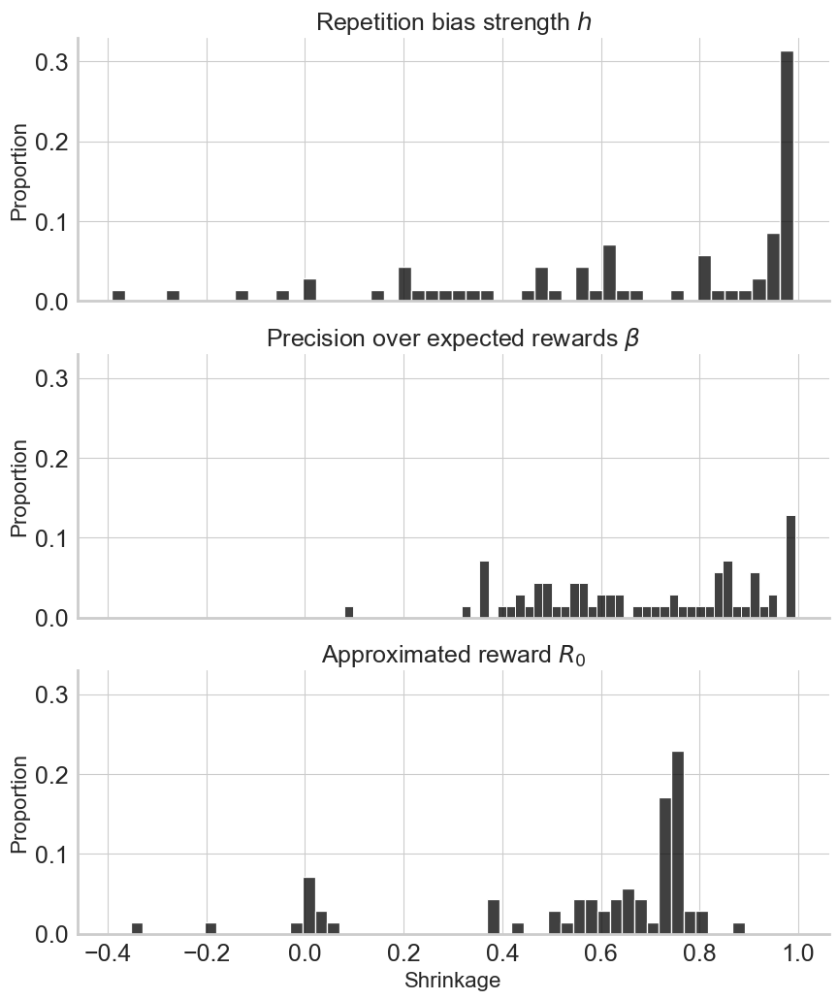

In [14]:
# create list with free parameter names
parameterNames = ('h', 'beta', 'R0')
xLabels = (f'Repetition bias strength $h$', fr'Precision over expected rewards $\beta$', fr'Approximated reward $R_0$')

# create the panda and feed it
dfPosteriorMeans = pd.DataFrame()

fig, axs = plt.subplots(3,1, figsize=(10,12), gridspec_kw={'hspace':.2}, sharey=True, sharex=True)

for i, p in enumerate(parameterNames):
    dfPosteriorMeans[f'{p}_mean'] = az.summary(posteriorsEVPRM, var_names=[f'{p}'])['mean'].to_numpy()
    dfPosteriorMeans[f'{p}_SD'] = az.summary(posteriorsEVPRM, var_names=[f'{p}'])['sd'].to_numpy()
    dfPosteriorMeans[f'{p}_shrinkage'] = 1-(dfPosteriorMeans[f'{p}_SD']/priorSDs[i])

    sns.histplot(data=dfPosteriorMeans, x=f'{p}_shrinkage', bins=50, stat='proportion', ax=axs[i], color='black')
    axs[i].set_title(xLabels[i])
    axs[i].set_xlabel('Shrinkage')

sns.despine()

plt.savefig('../figures/shrinkage_EVPRM.svg', format='svg')

plt.show()

In [19]:
np.where(dfPosteriorMeans['h_shrinkage'].to_numpy()>.80, 1, 0).sum()

35

### Precision on expected rewards $\beta$

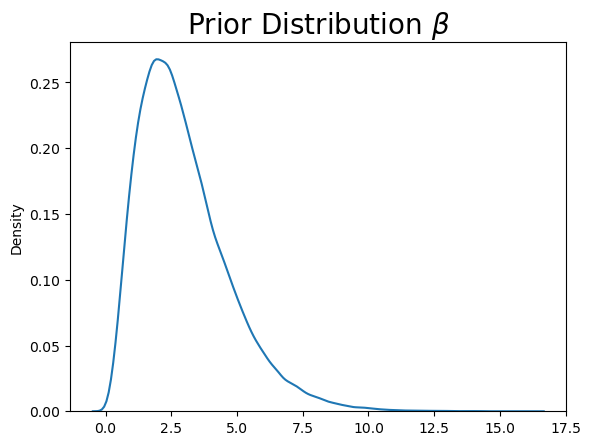

In [56]:
plt.figure()
sns.kdeplot(data=priors.prior['beta'].to_numpy().flatten())
plt.title(r'Prior Distribution $\beta$', fontsize=20)
plt.show()

In [ ]:
az.plot_posterior(posteriorsEVPRM, var_names=['beta'], hdi_prob=.95);

/Users/Eric/miniconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/plots/backends/matplotlib/distcomparisonplot.py:71: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**backend_kwargs)


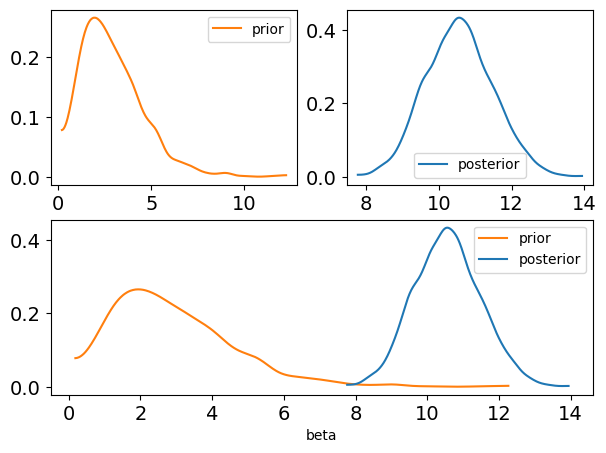

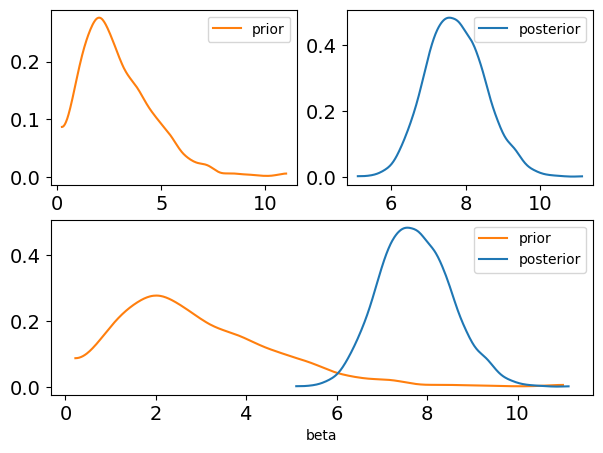

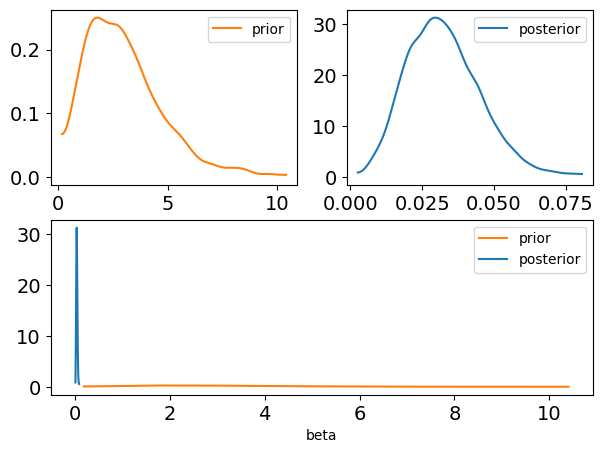

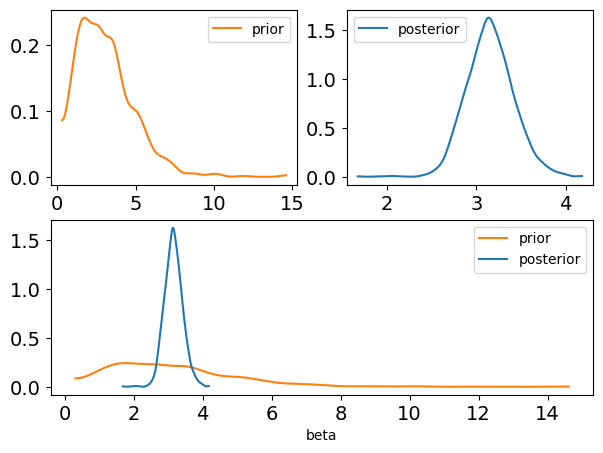

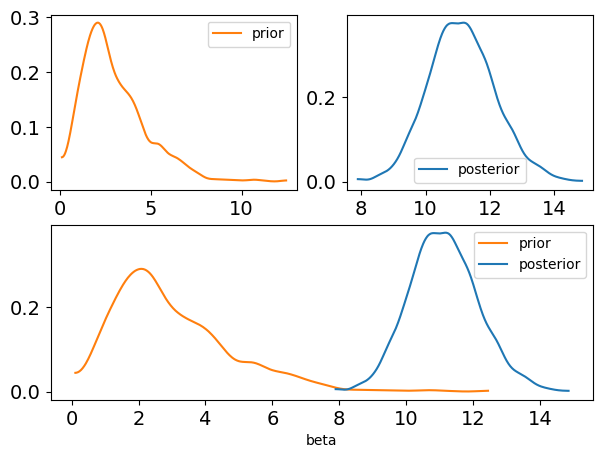

...

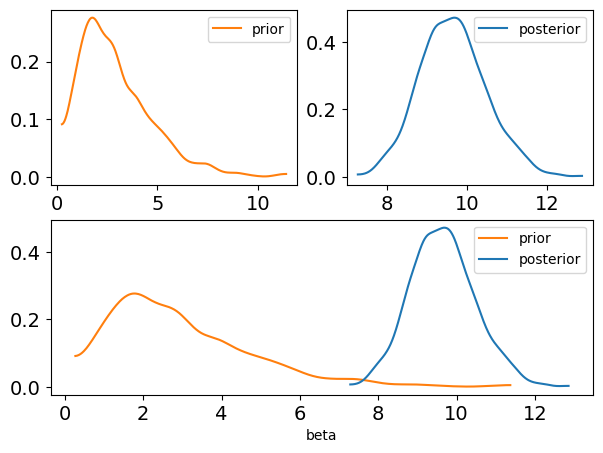

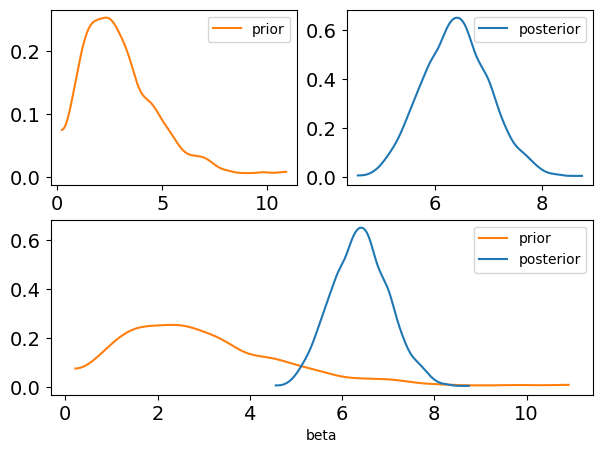

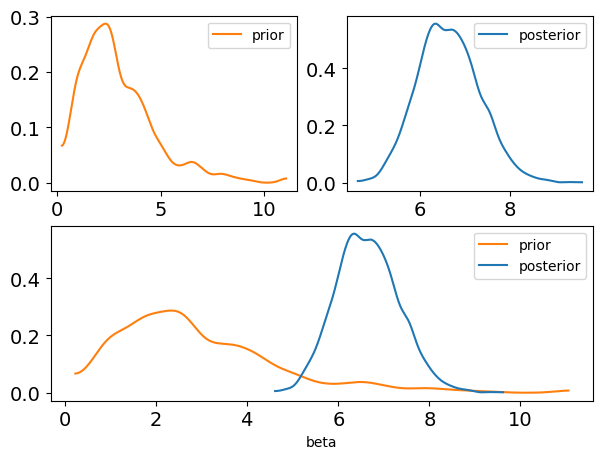

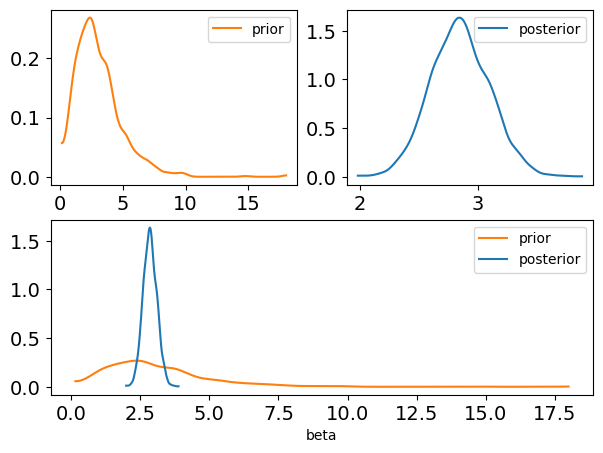

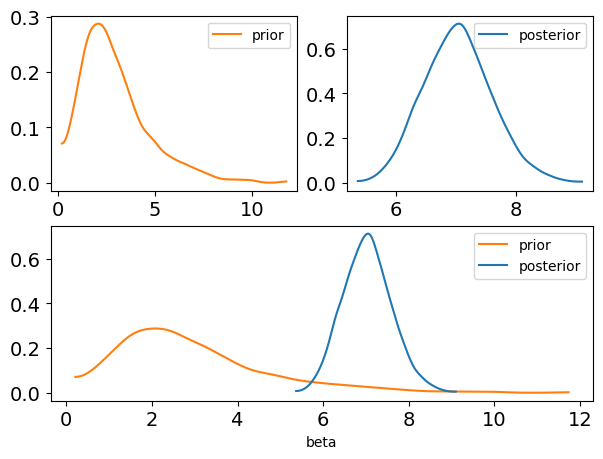

In [44]:
for i in range(70):
    az.plot_dist_comparison(posteriorsEVPRM, var_names=['beta'], coords={'beta_dim_0':i}, figsize=(7,5));

### Approximated Reward $R_0$

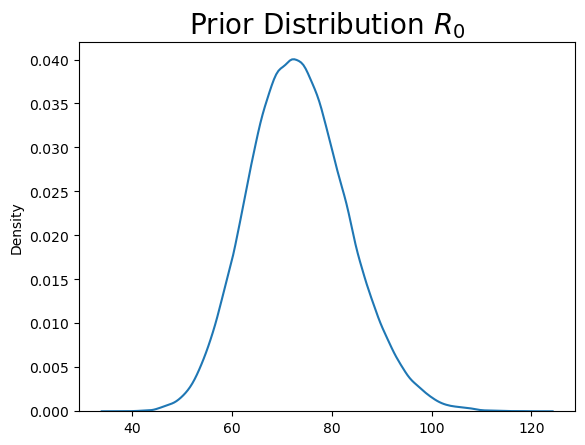

In [57]:
plt.figure()
sns.kdeplot(data=priors.prior['R0'].to_numpy().flatten())
plt.title(r'Prior Distribution $R_0$', fontsize=20)
plt.show()

In [ ]:
az.plot_posterior(posteriorsEVPRM, var_names=['R0'], hdi_prob=.95);

/Users/Eric/miniconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/plots/backends/matplotlib/distcomparisonplot.py:71: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**backend_kwargs)


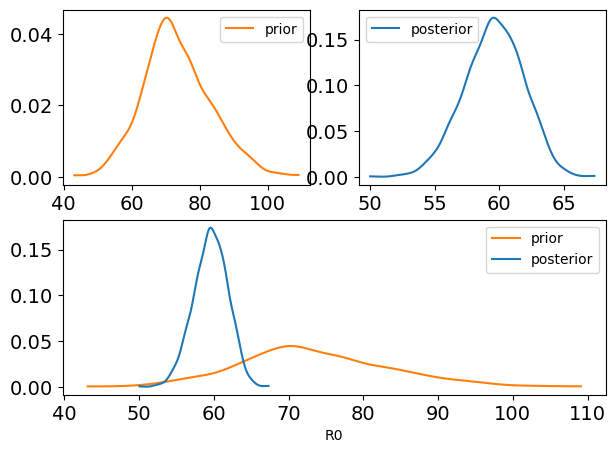

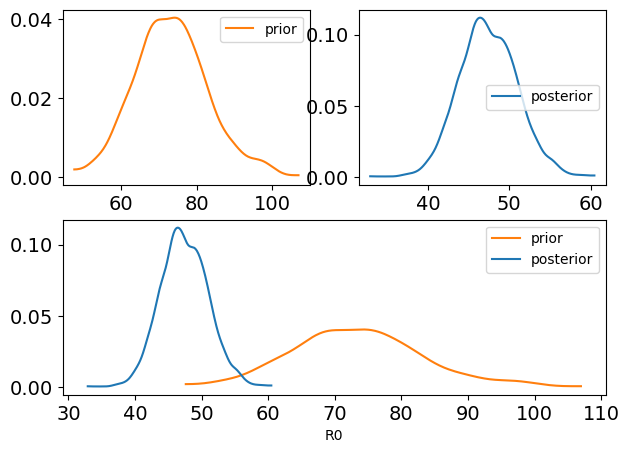

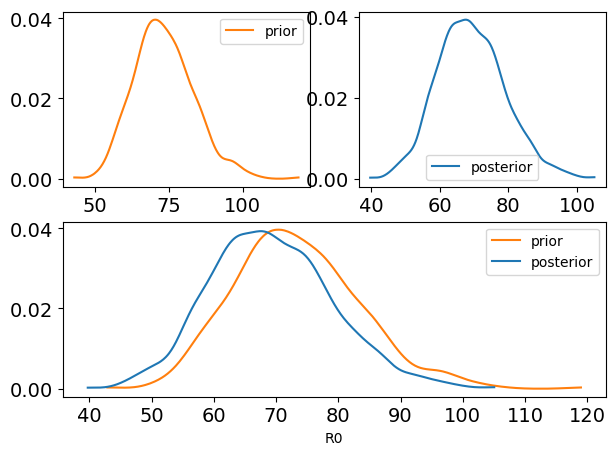

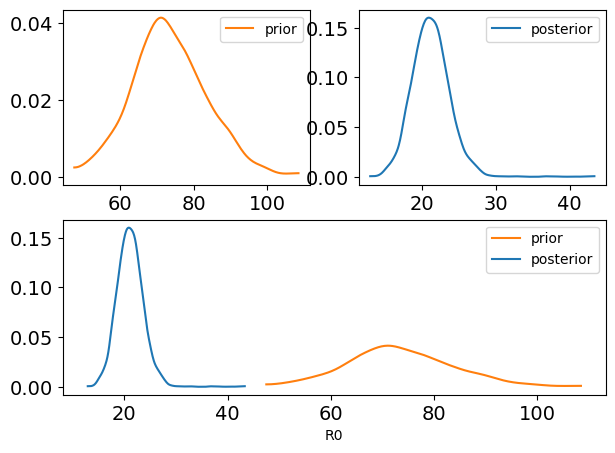

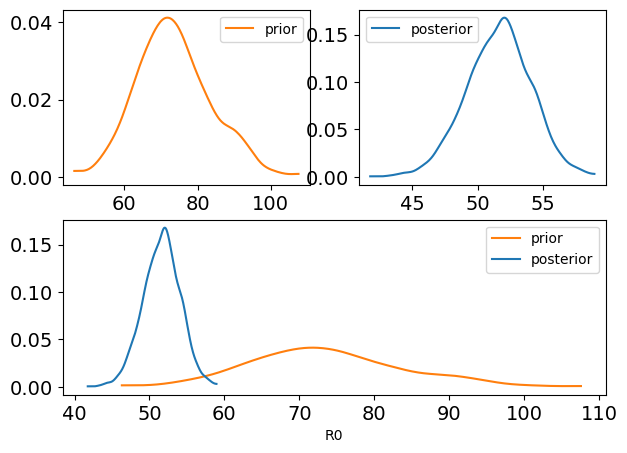

...

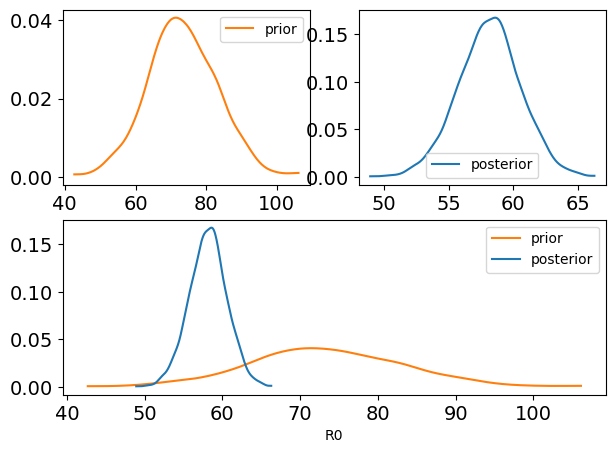

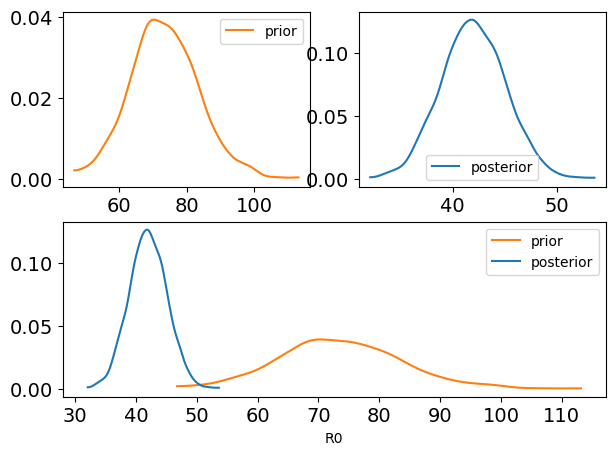

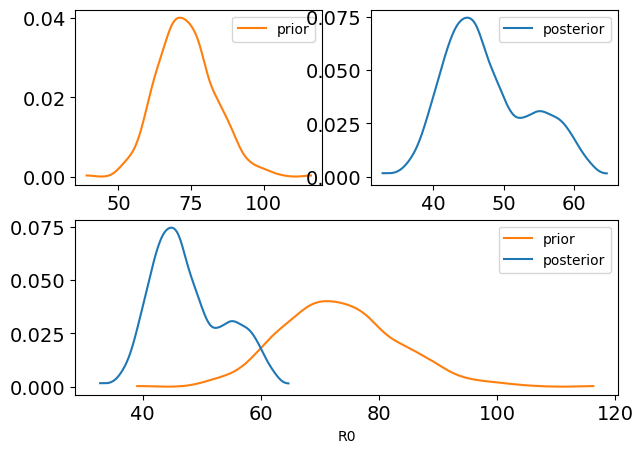

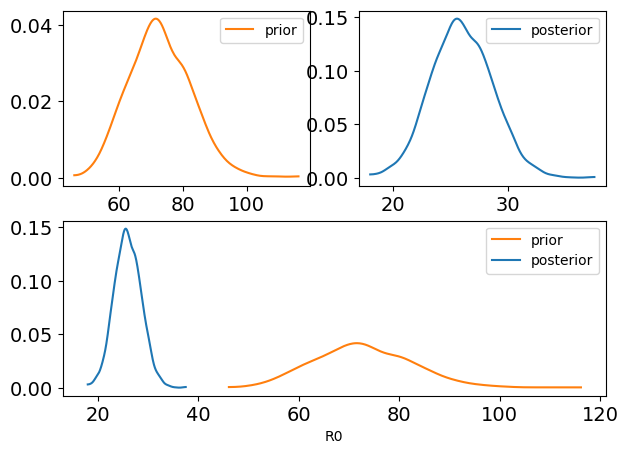

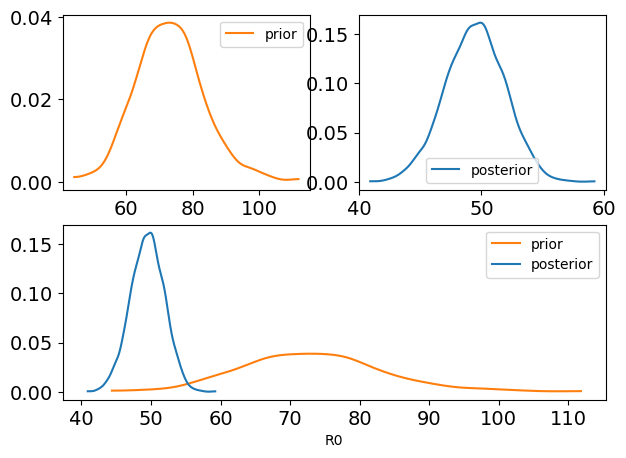

In [46]:
for i in range(70):
    az.plot_dist_comparison(posteriorsEVPRM, var_names=['R0'], coords={'R0_dim_0':i}, figsize=(7,5));

### Repetition Bias $h$

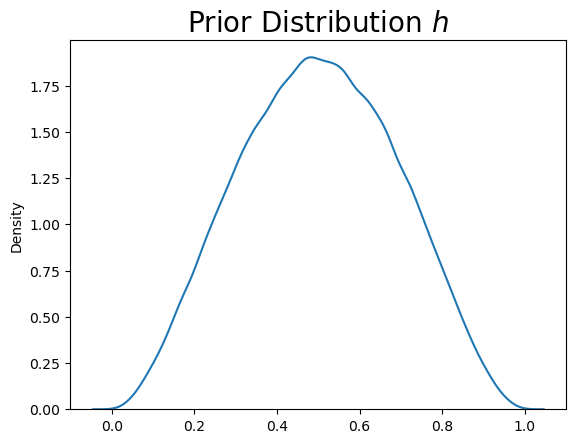

In [58]:
plt.figure()
sns.kdeplot(data=priors.prior['h'].to_numpy().flatten())
plt.title(r'Prior Distribution $h$', fontsize=20)
plt.show()

In [ ]:
az.plot_posterior(posteriorsEVPRM, var_names=['h'], hdi_prob=.95);

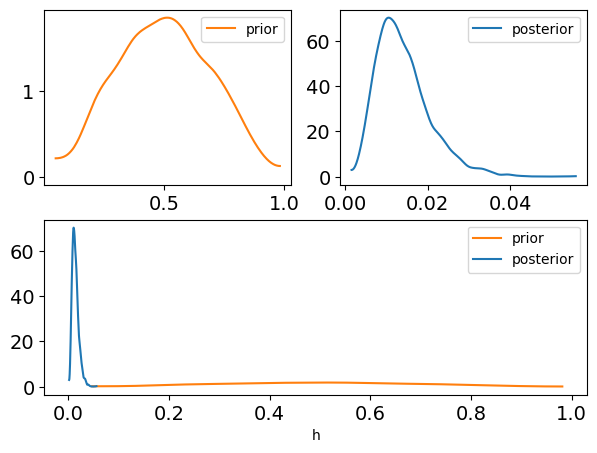

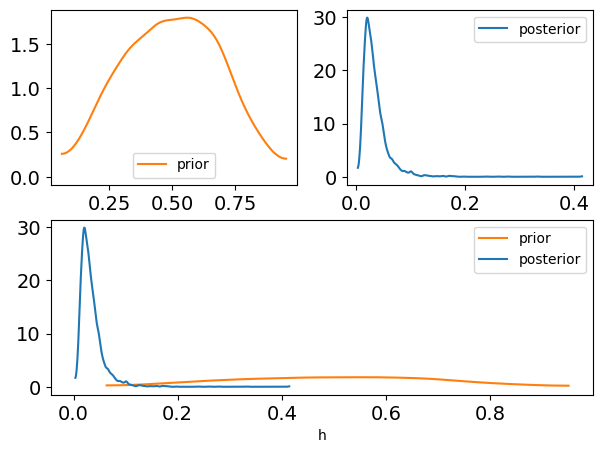

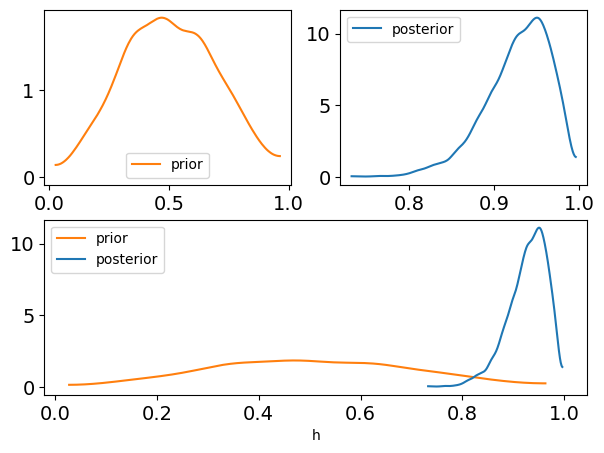

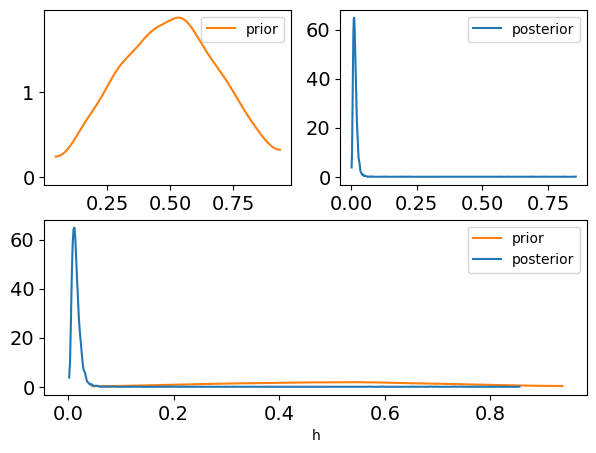

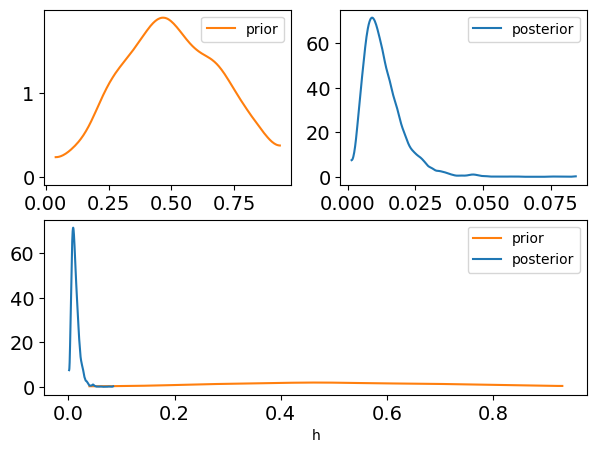

...

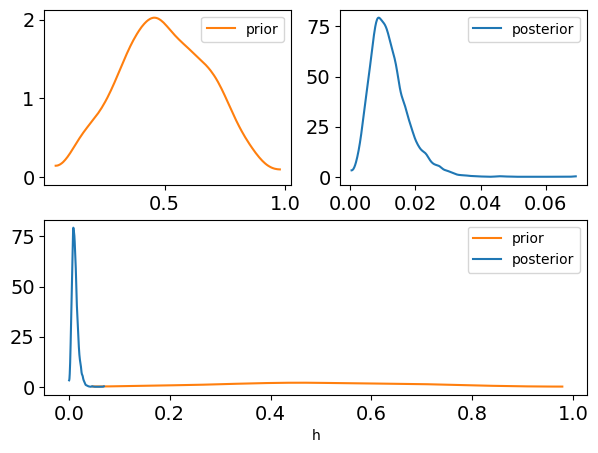

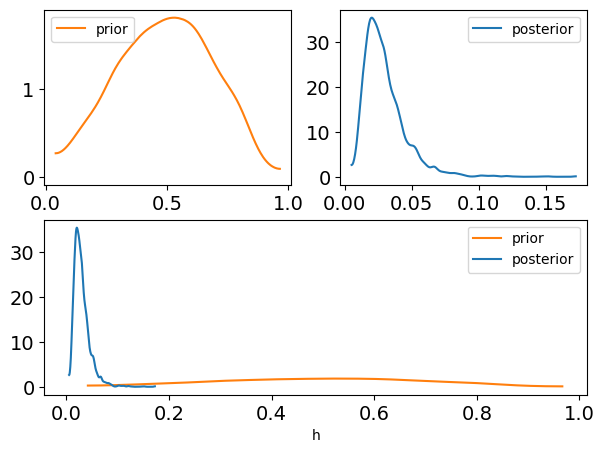

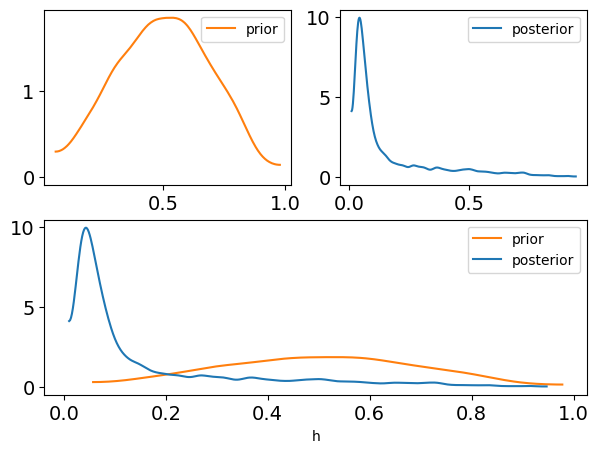

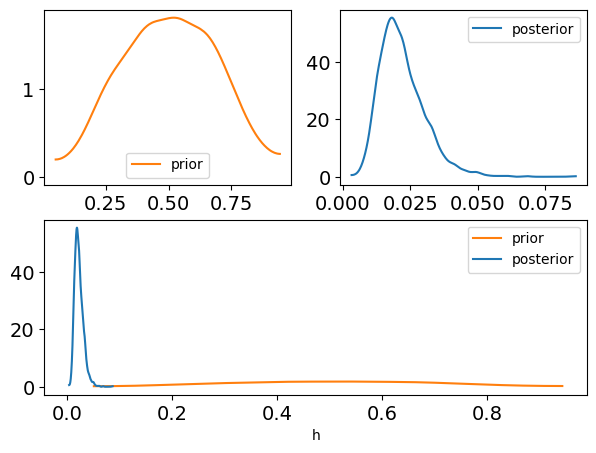

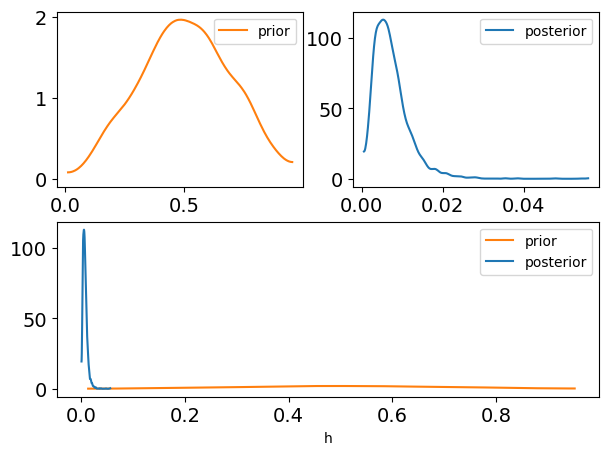

In [47]:
for i in range(70):
    az.plot_dist_comparison(posteriorsEVPRM, var_names=['h'], coords={'h_dim_0':i}, figsize=(7,5));